In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pathlib
data_dir = pathlib.Path('/content/drive/My Drive/car_photos/')

In [ ]:
image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)

253


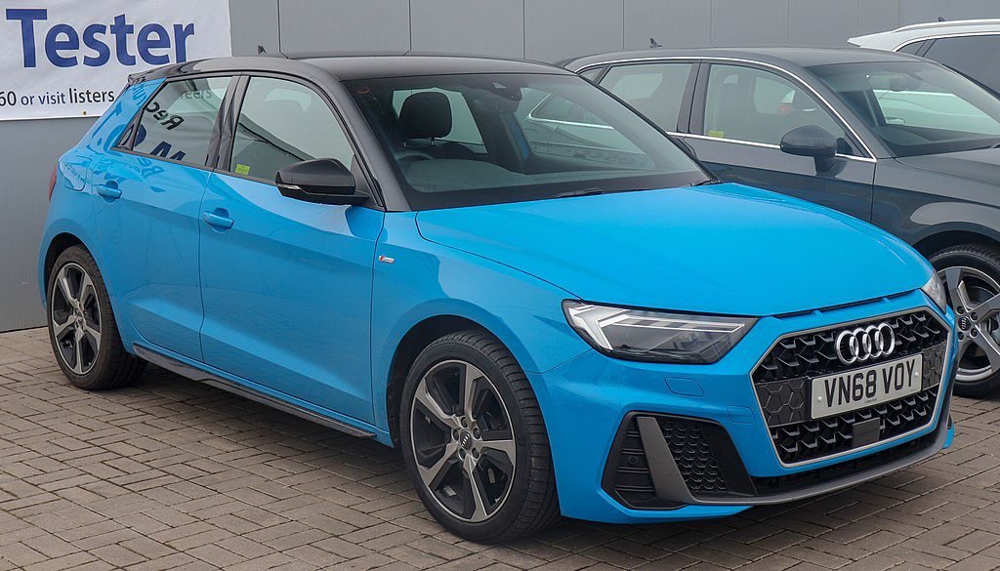

In [ ]:
audi = list(data_dir.glob('Audi/*'))
PIL.Image.open(str(audi[0]))


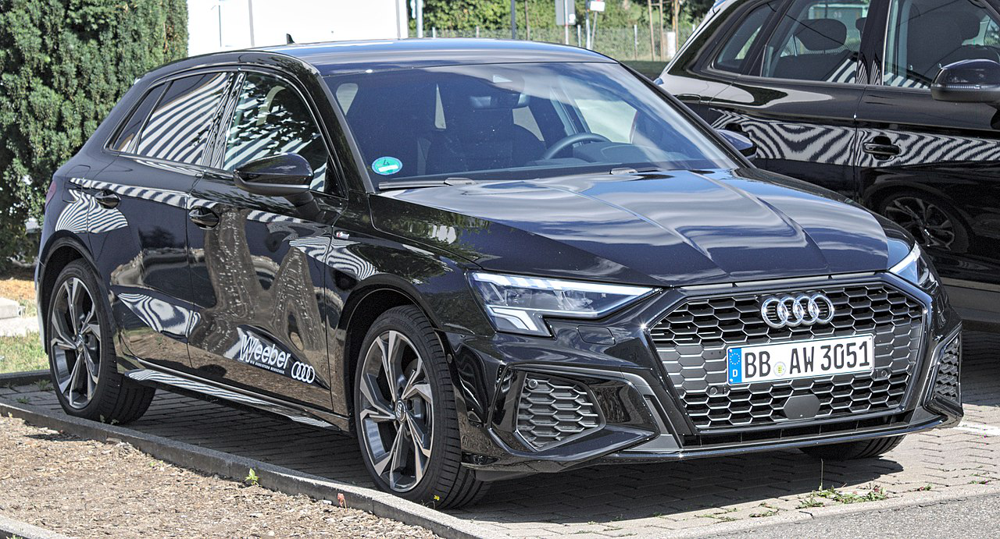

In [ ]:
PIL.Image.open(str(audi[1]))


In [ ]:
batch_size = 32
img_height = 180
img_width = 180
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 263 files belonging to 3 classes.
Using 211 files for training.
Found 263 files belonging to 3 classes.
Using 52 files for validation.


In [ ]:
class_names = train_ds.class_names
print(class_names)


['Audi', 'BMW', 'Mercedes-Benz']


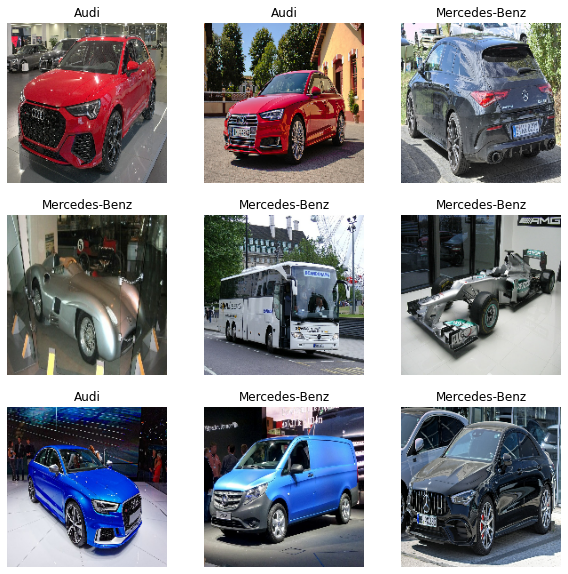

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")


In [ ]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break


(32, 180, 180, 3)
(32,)


In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)
normalization_layer = layers.Rescaling(1./255)
normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
# Notice the pixel values are now in `[0,1]`.
print(np.min(first_image), np.max(first_image))

0.0 1.0


In [ ]:
num_classes = len(class_names)

model = Sequential([
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
model.summary()


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_2 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 90, 90, 16)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 45, 45, 32)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 45, 45, 64)       

In [ ]:

epochs=15
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/15
7/7 [==============================] - 22s 3s/step - loss: 1.3896 - accuracy: 0.4076 - val_loss: 1.1174 - val_accuracy: 0.4615
Epoch 2/15
7/7 [==============================] - 10s 2s/step - loss: 0.9650 - accuracy: 0.5687 - val_loss: 1.2149 - val_accuracy: 0.4615
Epoch 3/15
7/7 [==============================] - 9s 1s/step - loss: 0.9316 - accuracy: 0.5782 - val_loss: 1.0780 - val_accuracy: 0.4615
Epoch 4/15
7/7 [==============================] - 7s 1s/step - loss: 0.8365 - accuracy: 0.5877 - val_loss: 1.0463 - val_accuracy: 0.5000
Epoch 5/15
7/7 [==============================] - 7s 1s/step - loss: 0.7129 - accuracy: 0.7393 - val_loss: 1.0356 - val_accuracy: 0.5000
Epoch 6/15
7/7 [==============================] - 8s 1s/step - loss: 0.5019 - accuracy: 0.8436 - val_loss: 1.2938 - val_accuracy: 0.4808
Epoch 7/15
7/7 [==============================] - 7s 1s/step - loss: 0.3136 - accuracy: 0.9242 - val_loss: 1.2994 - val_accuracy: 0.4231
Epoch 8/15
7/7 [=======================

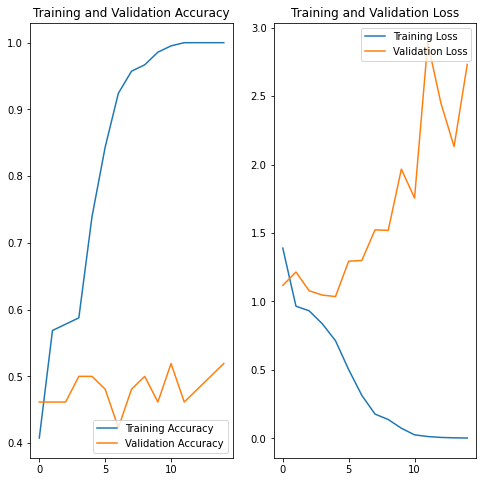

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()


In [ ]:
data_augmentation = keras.Sequential(
  [
    layers.RandomFlip("horizontal",
                      input_shape=(img_height,
                                  img_width,
                                  3)),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
  ]
)


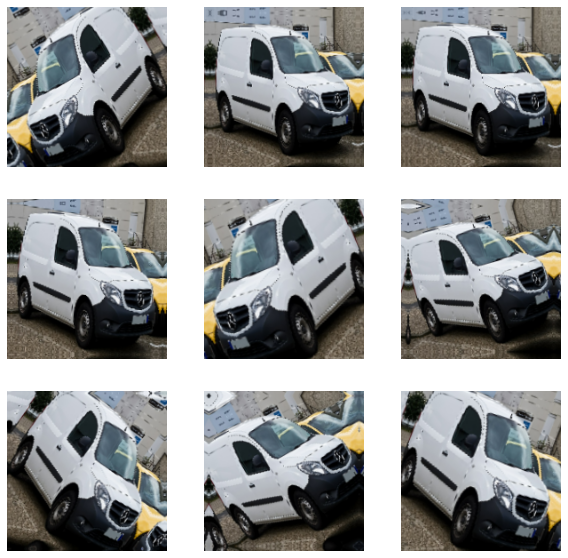

In [ ]:
plt.figure(figsize=(10, 10))
for images, _ in train_ds.take(1):
  for i in range(9):
    augmented_images = data_augmentation(images)
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(augmented_images[0].numpy().astype("uint8"))
    plt.axis("off")


In [ ]:
model = Sequential([
  data_augmentation,
  layers.Rescaling(1./255),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout(0.2),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes, name="outputs")
])
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
model.summary()


Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_2 (Sequential)   (None, 180, 180, 3)       0         
                                                                 
 rescaling_4 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_9 (Conv2D)           (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 90, 90, 16)       0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 45, 45, 32)       0         
 g2D)                                                 

In [ ]:
epochs = 30
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)


Epoch 1/30
7/7 [==============================] - 12s 2s/step - loss: 0.7860 - accuracy: 0.6114 - val_loss: 1.1645 - val_accuracy: 0.4808
Epoch 2/30
7/7 [==============================] - 8s 1s/step - loss: 0.7859 - accuracy: 0.6351 - val_loss: 1.1411 - val_accuracy: 0.4615
Epoch 3/30
7/7 [==============================] - 9s 1s/step - loss: 0.7373 - accuracy: 0.6398 - val_loss: 1.1891 - val_accuracy: 0.4808
Epoch 4/30
7/7 [==============================] - 8s 1s/step - loss: 0.7258 - accuracy: 0.6682 - val_loss: 1.0731 - val_accuracy: 0.5577
Epoch 5/30
7/7 [==============================] - 9s 1s/step - loss: 0.6723 - accuracy: 0.7536 - val_loss: 1.1138 - val_accuracy: 0.5192
Epoch 6/30
7/7 [==============================] - 8s 1s/step - loss: 0.6657 - accuracy: 0.6872 - val_loss: 1.3341 - val_accuracy: 0.4038
Epoch 7/30
7/7 [==============================] - 8s 1s/step - loss: 0.6840 - accuracy: 0.7062 - val_loss: 1.1488 - val_accuracy: 0.5385
Epoch 8/30
7/7 [========================

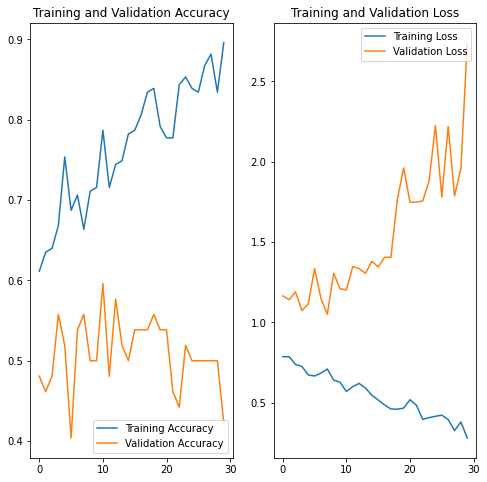

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()


In [ ]:
data_dir_test = pathlib.Path('/content/drive/My Drive/car_test/')
print(data_dir_test)

/content/drive/My Drive/car_test


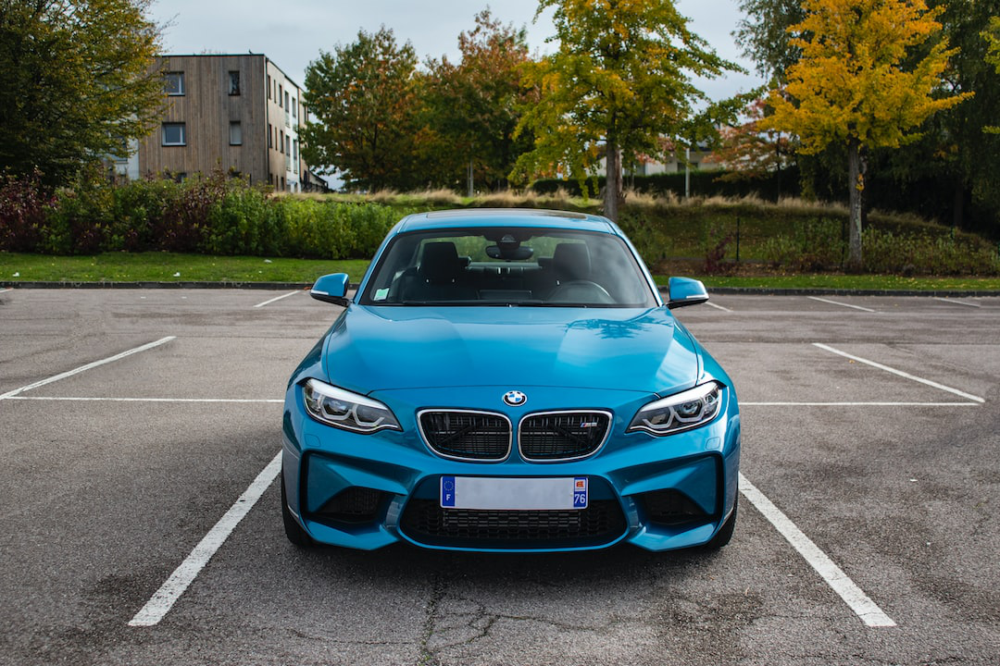

In [ ]:
image_url = str(data_dir_test)+'/bmw2.jpeg'
PIL.Image.open((image_url))


In [ ]:
img = tf.keras.utils.load_img(
    image_url, target_size=(img_height, img_width)
)
img_array = tf.keras.utils.img_to_array(img)
img_array = tf.expand_dims(img_array, 0) # Create a batch

predictions = model.predict(img_array)
score = tf.nn.softmax(predictions[0])


print(
    "{}: {:.2f}% confidence."
    .format(class_names[0], 100 * score[0])
)
print(
    "{}: {:.2f}% confidence."
    .format(class_names[1], 100 * score[1])
)
print(
    "{}: {:.2f}% confidence."
    .format(class_names[2], 100 * score[2])
)


print(
    "This image most likely belongs to {} with a {:.2f} percent confidence."
    .format(class_names[np.argmax(score)], 100 * np.max(score))
)


1/1 [==============================] - 0s 36ms/step
Audi: 14.89% confidence.
BMW: 0.18% confidence.
Mercedes-Benz: 84.93% confidence.
This image most likely belongs to Mercedes-Benz with a 84.93 percent confidence.


In [ ]:
from DeepImageSearch import Index,LoadData,SearchImage
image_list_audi = LoadData().from_folder(['/content/drive/My Drive/car_photos/Audi'])
image_list_bmw = LoadData().from_folder(['/content/drive/My Drive/car_photos/BMW'])
image_list_benz = LoadData().from_folder(['/content/drive/My Drive/car_photos/Mercedes-Benz'])


In [ ]:
print(len(image_list_audi))
print(len(image_list_bmw))

image_list_benz = image_list_benz + image_list_audi + image_list_bmw
print(len(image_list_benz))


58
61
265


In [ ]:
Index(image_list_audi).Start()


Metadata and Features are allready present, Do you want Extract Again? Enter yes or no
yes


  0%|          | 0/58 [00:00<?, ?it/s]

1/1 [==============================] - 1s 726ms/step


  2%|▏         | 1/58 [00:00<00:45,  1.26it/s]

1/1 [==============================] - 1s 621ms/step


  3%|▎         | 2/58 [00:01<00:41,  1.35it/s]

1/1 [==============================] - 1s 571ms/step


  5%|▌         | 3/58 [00:02<00:37,  1.45it/s]

1/1 [==============================] - 1s 578ms/step


  7%|▋         | 4/58 [00:02<00:36,  1.50it/s]

1/1 [==============================] - 1s 577ms/step


  9%|▊         | 5/58 [00:03<00:34,  1.52it/s]

1/1 [==============================] - 1s 583ms/step


 10%|█         | 6/58 [00:04<00:33,  1.53it/s]

1/1 [==============================] - 1s 591ms/step


 12%|█▏        | 7/58 [00:04<00:34,  1.50it/s]

1/1 [==============================] - 1s 568ms/step


 14%|█▍        | 8/58 [00:05<00:32,  1.53it/s]

1/1 [==============================] - 1s 578ms/step


 16%|█▌        | 9/58 [00:06<00:31,  1.54it/s]

1/1 [==============================] - 1s 578ms/step


 17%|█▋        | 10/58 [00:06<00:30,  1.55it/s]

1/1 [==============================] - 1s 567ms/step


 19%|█▉        | 11/58 [00:07<00:30,  1.56it/s]

1/1 [==============================] - 1s 575ms/step


 21%|██        | 12/58 [00:07<00:29,  1.57it/s]

1/1 [==============================] - 1s 570ms/step


 22%|██▏       | 13/58 [00:08<00:28,  1.57it/s]

1/1 [==============================] - 1s 573ms/step


 24%|██▍       | 14/58 [00:09<00:27,  1.57it/s]

1/1 [==============================] - 1s 597ms/step


 26%|██▌       | 15/58 [00:09<00:27,  1.56it/s]

1/1 [==============================] - 1s 579ms/step


 28%|██▊       | 16/58 [00:10<00:26,  1.56it/s]

1/1 [==============================] - 1s 582ms/step


 29%|██▉       | 17/58 [00:11<00:26,  1.55it/s]

1/1 [==============================] - 1s 584ms/step


 31%|███       | 18/58 [00:11<00:25,  1.55it/s]

1/1 [==============================] - 1s 582ms/step


 33%|███▎      | 19/58 [00:12<00:25,  1.56it/s]

1/1 [==============================] - 1s 583ms/step


 34%|███▍      | 20/58 [00:13<00:24,  1.55it/s]

1/1 [==============================] - 1s 586ms/step


 36%|███▌      | 21/58 [00:13<00:23,  1.55it/s]

1/1 [==============================] - 1s 580ms/step


 38%|███▊      | 22/58 [00:14<00:23,  1.55it/s]

1/1 [==============================] - 1s 642ms/step


 40%|███▉      | 23/58 [00:15<00:29,  1.18it/s]

1/1 [==============================] - 1s 632ms/step


 41%|████▏     | 24/58 [00:16<00:27,  1.24it/s]

1/1 [==============================] - 1s 627ms/step


 43%|████▎     | 25/58 [00:17<00:25,  1.30it/s]

1/1 [==============================] - 1s 587ms/step


 45%|████▍     | 26/58 [00:17<00:23,  1.36it/s]

1/1 [==============================] - 1s 602ms/step


 47%|████▋     | 27/58 [00:18<00:22,  1.39it/s]

1/1 [==============================] - 1s 617ms/step


 48%|████▊     | 28/58 [00:19<00:21,  1.41it/s]

1/1 [==============================] - 1s 588ms/step


 50%|█████     | 29/58 [00:19<00:20,  1.44it/s]

1/1 [==============================] - 1s 612ms/step


 52%|█████▏    | 30/58 [00:20<00:19,  1.46it/s]

1/1 [==============================] - 1s 597ms/step


 53%|█████▎    | 31/58 [00:21<00:18,  1.47it/s]

1/1 [==============================] - 1s 597ms/step


 55%|█████▌    | 32/58 [00:21<00:17,  1.48it/s]

1/1 [==============================] - 1s 620ms/step


 57%|█████▋    | 33/58 [00:22<00:16,  1.47it/s]

1/1 [==============================] - 1s 620ms/step


 59%|█████▊    | 34/58 [00:23<00:16,  1.47it/s]

1/1 [==============================] - 1s 616ms/step


 60%|██████    | 35/58 [00:23<00:15,  1.47it/s]

1/1 [==============================] - 1s 616ms/step


 62%|██████▏   | 36/58 [00:24<00:15,  1.47it/s]

1/1 [==============================] - 1s 664ms/step


 64%|██████▍   | 37/58 [00:25<00:14,  1.43it/s]

1/1 [==============================] - 1s 568ms/step


 66%|██████▌   | 38/58 [00:25<00:13,  1.46it/s]

1/1 [==============================] - 1s 591ms/step


 67%|██████▋   | 39/58 [00:26<00:12,  1.49it/s]

1/1 [==============================] - 1s 566ms/step


 69%|██████▉   | 40/58 [00:27<00:11,  1.52it/s]

1/1 [==============================] - 1s 568ms/step


 71%|███████   | 41/58 [00:27<00:11,  1.54it/s]

1/1 [==============================] - 1s 579ms/step


 72%|███████▏  | 42/58 [00:28<00:10,  1.55it/s]

1/1 [==============================] - 1s 573ms/step


 74%|███████▍  | 43/58 [00:29<00:09,  1.56it/s]

1/1 [==============================] - 1s 579ms/step


 76%|███████▌  | 44/58 [00:29<00:08,  1.57it/s]

1/1 [==============================] - 1s 569ms/step


 78%|███████▊  | 45/58 [00:30<00:08,  1.57it/s]

1/1 [==============================] - 1s 591ms/step


 79%|███████▉  | 46/58 [00:30<00:07,  1.56it/s]

1/1 [==============================] - 1s 602ms/step


 81%|████████  | 47/58 [00:31<00:07,  1.52it/s]

1/1 [==============================] - 1s 614ms/step


 83%|████████▎ | 48/58 [00:32<00:06,  1.50it/s]

1/1 [==============================] - 1s 595ms/step


 84%|████████▍ | 49/58 [00:32<00:05,  1.50it/s]

1/1 [==============================] - 1s 584ms/step


 86%|████████▌ | 50/58 [00:33<00:05,  1.52it/s]

1/1 [==============================] - 1s 573ms/step


 88%|████████▊ | 51/58 [00:34<00:04,  1.53it/s]

1/1 [==============================] - 1s 580ms/step


 90%|████████▉ | 52/58 [00:34<00:03,  1.54it/s]

1/1 [==============================] - 1s 627ms/step


 91%|█████████▏| 53/58 [00:35<00:03,  1.51it/s]

1/1 [==============================] - 1s 589ms/step


 93%|█████████▎| 54/58 [00:36<00:02,  1.52it/s]

1/1 [==============================] - 1s 630ms/step


 95%|█████████▍| 55/58 [00:36<00:02,  1.49it/s]

1/1 [==============================] - 1s 617ms/step


 97%|█████████▋| 56/58 [00:37<00:01,  1.48it/s]

1/1 [==============================] - 1s 582ms/step


 98%|█████████▊| 57/58 [00:38<00:00,  1.49it/s]

1/1 [==============================] - 1s 576ms/step


100%|██████████| 58/58 [00:38<00:00,  1.49it/s]


Image Meta Information Saved: [meta-data-files/image_data_features.pkl]


58it [00:00, 1911.34it/s]

Saved the Indexed File:[meta-data-files/image_features_vectors.ann]


In [ ]:
similarest_image = SearchImage().get_similar_images(image_path=image_url,number_of_images=1)


1/1 [==============================] - 1s 743ms/step


In [ ]:
print(similarest_image[2])

/content/drive/My Drive/car_photos/Audi/2015_Audi_A4_B9_3.0_TDI_quattro_V6_200_kW_S_line_Tangorot_Vorderansicht.jpg


1/1 [==============================] - 1s 743ms/step


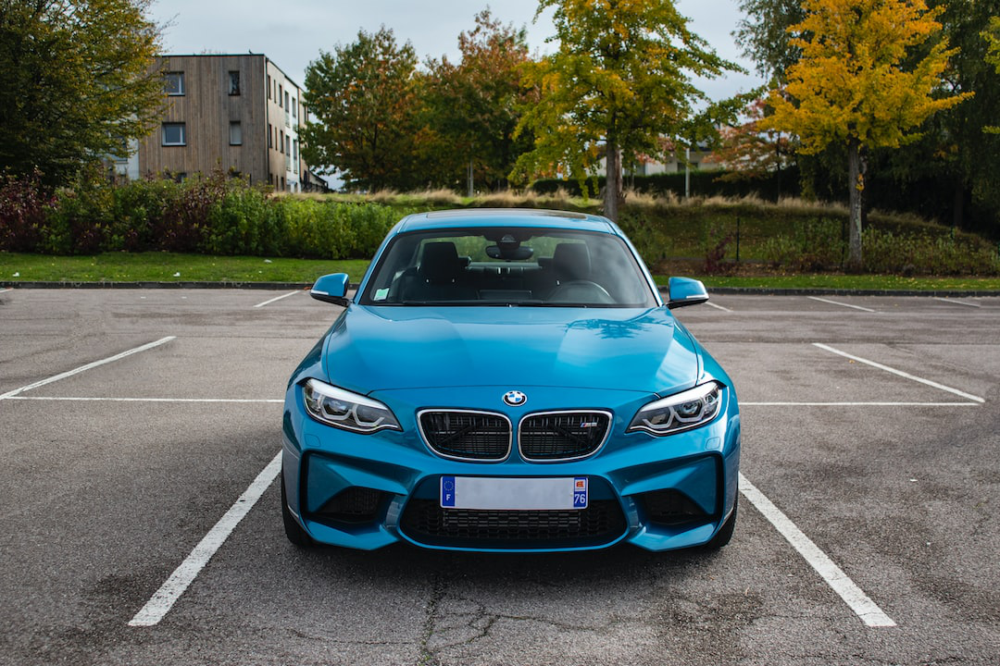

In [ ]:
image_url = str(data_dir_test)+'/bmw2.jpeg'
PIL.Image.open((image_url))


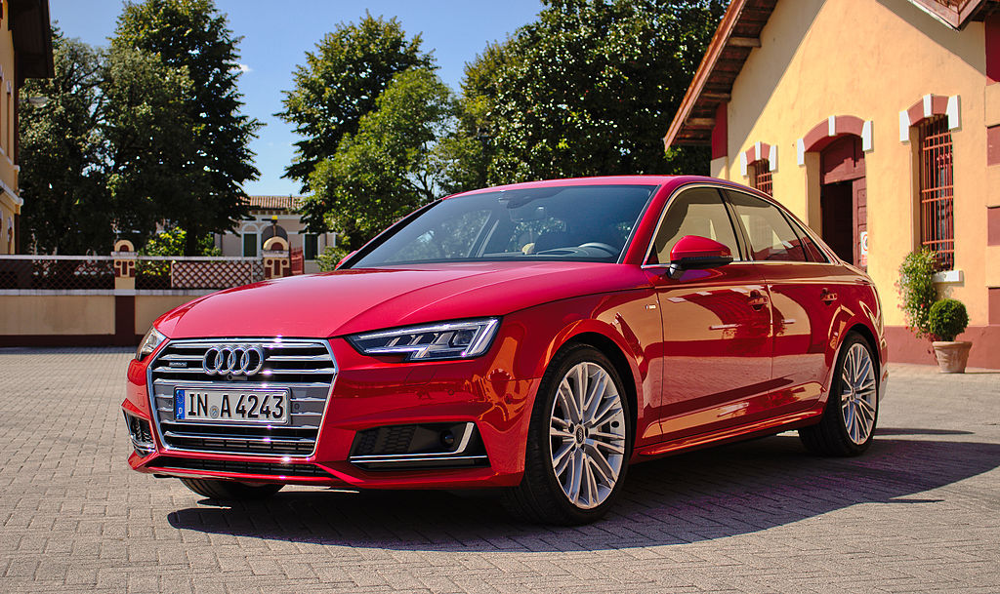

In [ ]:
PIL.Image.open((similarest_image[2]))